In [1]:
import os
import sys
from pathlib import Path

import numpy as np
import tensorflow as tf
from matplotlib import pyplot as plt

sys.path.append(os.fspath(Path.cwd().parent.resolve()))

2024-02-01 13:17:04.945017: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-01 13:17:04.965711: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-01 13:17:04.965731: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-01 13:17:04.966401: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-01 13:17:04.970488: I tensorflow/core/platform/cpu_feature_guar

In [2]:
from anime4k_tf.image import transform_evaluation_images, transform_training_images
from anime4k_tf.losses import YUVError
from anime4k_tf.models import get_sr2_model
from anime4k_tf.visualization import show_images

In [3]:
# tf.keras.utils.set_random_seed(1)
# tf.config.experimental.enable_op_determinism()

In [4]:
data_dir = Path("../../data/synla").resolve()
output_signature = tf.TensorSpec(shape=(256, 256, 3), dtype=tf.uint8)
batch_size = 32

np_synla_4096 = np.load(data_dir / "synla_4096.npy")
training_set = (
    tf.data.Dataset.from_generator(
        lambda: np_synla_4096, output_signature=output_signature
    )
    .repeat()
    .shuffle(1024, reshuffle_each_iteration=True)
    .map(
        transform_training_images,
        num_parallel_calls=tf.data.AUTOTUNE,
        deterministic=False,
    )
    .batch(batch_size, deterministic=False)
    .prefetch(tf.data.AUTOTUNE)
)

np_synla_1024 = np.load(data_dir / "synla_1024.npy")
validation_set = (
    tf.data.Dataset.from_generator(
        lambda: np_synla_1024, output_signature=output_signature
    )
    .map(
        transform_evaluation_images,
        num_parallel_calls=tf.data.AUTOTUNE,
        deterministic=False,
    )
    .batch(batch_size, deterministic=False)
    .prefetch(tf.data.AUTOTUNE)
)

2024-02-01 13:17:06.233990: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-01 13:17:06.253228: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-01 13:17:06.253261: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-01 13:17:06.256563: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-01 13:17:06.256593: I external/local_xla/xla/stream_executor

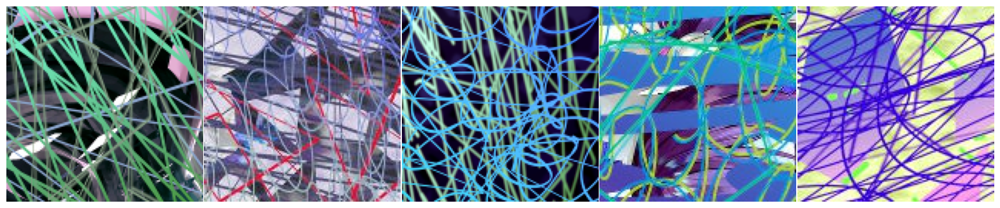

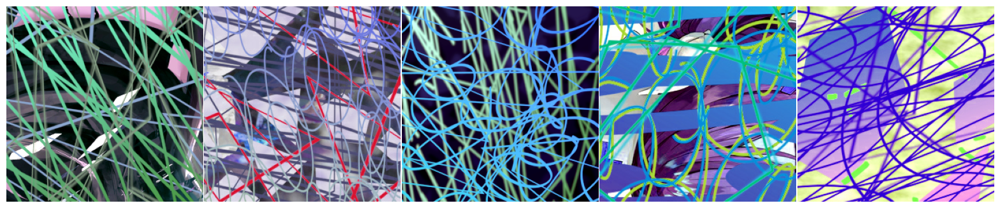

In [5]:
inputs, targets = next(iter(training_set))
show_images(plt.figure(figsize=(20, 20)), inputs[:5])
show_images(plt.figure(figsize=(20, 20)), targets[:5])

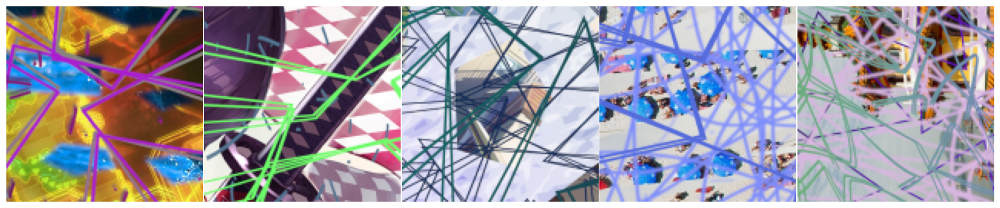

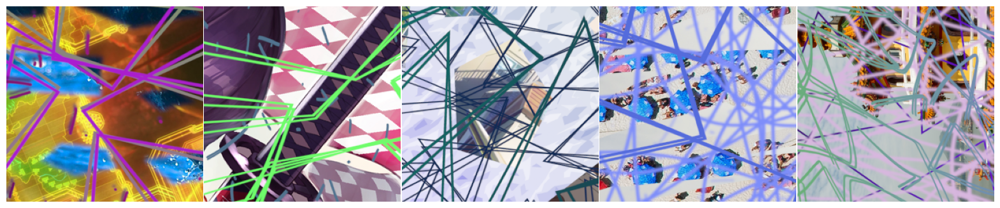

In [6]:
inputs, targets = next(iter(validation_set))
show_images(plt.figure(figsize=(20, 20)), inputs[:5])
show_images(plt.figure(figsize=(20, 20)), targets[:5])

In [7]:
model = get_sr2_model(input_depth=3, highway_depth=4, block_depth=7)
model.summary(line_length=150)

Model: "model"
______________________________________________________________________________________________________________________________________________________
 Layer (type)                                Output Shape                                 Param #        Connected to                                 
 input_1 (InputLayer)                        [(None, None, None, 3)]                      0              []                                           
                                                                                                                                                      
 conv2d (Conv2D)                             (None, None, None, 4)                        112            ['input_1[0][0]']                            
                                                                                                                                                      
 tf.compat.v1.nn.crelu (TFOpLambda)          (None, None, None, 8)             

In [8]:
# Super-convergence with clipping
model.compile(
    optimizer=tf.keras.optimizers.legacy.SGD(
        learning_rate=10000.0, momentum=0.9, nesterov=True, clipvalue=0.00000001
    ),
    loss=YUVError(),
)
model.fit(training_set, steps_per_epoch=4096, validation_data=validation_set)

# Followed by fine tuning with Adam which allows somewhat fair convergence within a few minutes
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=YUVError())
model.fit(training_set, steps_per_epoch=4096 * 2, validation_data=validation_set)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss=YUVError())
model.fit(training_set, steps_per_epoch=4096 * 2, validation_data=validation_set)

2024-02-01 13:17:10.923681: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-02-01 13:17:11.072692: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-02-01 13:17:11.270983: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


4096/4096 [==============================] - 74s 17ms/step - loss: 0.0032 - val_loss: 0.0012


2024-02-01 13:18:24.055754: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 12403050369964221913
2024-02-01 13:18:24.055786: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4512167305332672692
2024-02-01 13:18:24.055790: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 11337022185400683492
2024-02-01 13:18:24.055803: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 6431283718407364592
2024-02-01 13:18:25.172126: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f311c008760 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-02-01 13:18:25.172160: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-02-01 13:18:25.181406: I tensorflow/compiler/mlir/t

8192/8192 [==============================] - 151s 18ms/step - loss: 0.0030 - val_loss: 0.0012


2024-02-01 13:20:55.067007: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4512167305332672692
2024-02-01 13:20:55.067038: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 6431283718407364592
2024-02-01 13:20:55.067043: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 12403050369964221913


8192/8192 [==============================] - 150s 18ms/step - loss: 0.0029 - val_loss: 0.0011


2024-02-01 13:23:25.307620: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 11337022185400683492


1/1 [==============================] - 0s 125ms/step


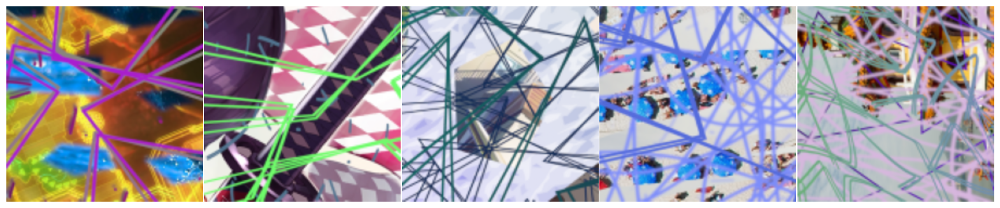

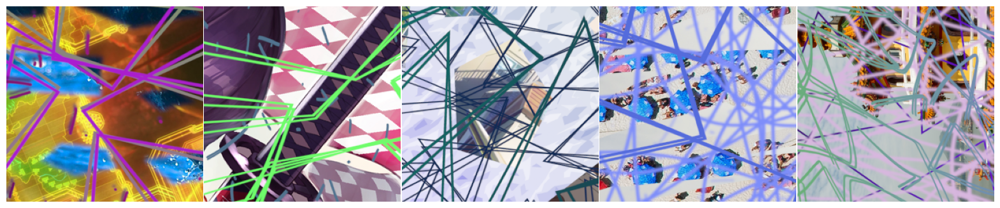

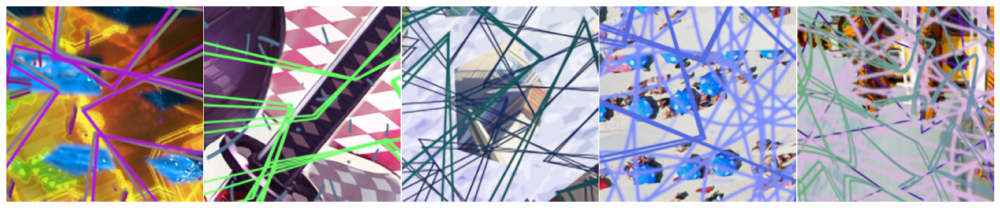

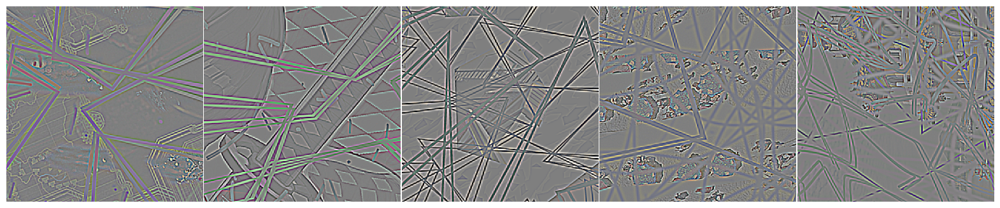

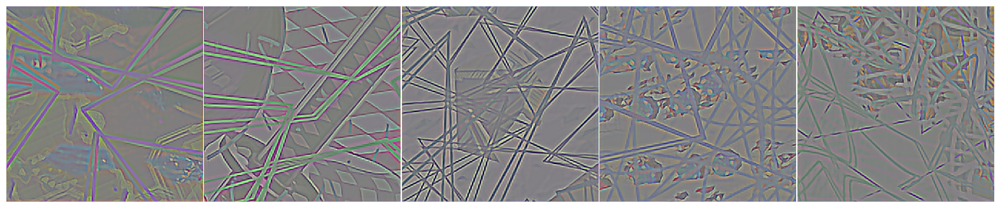

In [9]:
inputs, targets = next(iter(validation_set))
inputs = inputs[:5]
targets = targets[:5]
inputs_resized = tf.image.resize(inputs, tf.shape(targets)[-3:-1], method="bilinear")
outputs = model.predict(inputs)
show_images(plt.figure(figsize=(20, 20)), inputs_resized)
show_images(plt.figure(figsize=(20, 20)), targets)
show_images(plt.figure(figsize=(20, 20)), outputs)
show_images(
    plt.figure(figsize=(20, 20)), targets - inputs_resized, value_range=(-0.2, 0.2)
)
show_images(
    plt.figure(figsize=(20, 20)), outputs - inputs_resized, value_range=(-0.2, 0.2)
)